In [106]:
#House Price Prediction

import pandas as pd 
import numpy as np 
import matplotlib as mpl 
import matplotlib.pyplot as plt 
import seaborn as sns 
import plotly.express as px
from scipy import stats
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.preprocessing import OrdinalEncoder
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error
from sklearn.linear_model import LinearRegression
from sklearn.svm import SVR
from sklearn.tree import DecisionTreeRegressor, ExtraTreeRegressor
from sklearn.ensemble import RandomForestRegressor, AdaBoostRegressor, GradientBoostingRegressor
from xgboost import XGBRegressor

%matplotlib inline

import warnings 
warnings.filterwarnings('ignore')

In [56]:
df = pd.read_csv('../dataset/train.csv')
df

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,1456,60,RL,62.0,7917,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,8,2007,WD,Normal,175000
1456,1457,20,RL,85.0,13175,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,MnPrv,NaN,0,2,2010,WD,Normal,210000
1457,1458,70,RL,66.0,9042,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,GdPrv,Shed,2500,5,2010,WD,Normal,266500
1458,1459,20,RL,68.0,9717,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,4,2010,WD,Normal,142125


In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 81 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1460 non-null   int64  
 1   MSSubClass     1460 non-null   int64  
 2   MSZoning       1460 non-null   object 
 3   LotFrontage    1201 non-null   float64
 4   LotArea        1460 non-null   int64  
 5   Street         1460 non-null   object 
 6   Alley          91 non-null     object 
 7   LotShape       1460 non-null   object 
 8   LandContour    1460 non-null   object 
 9   Utilities      1460 non-null   object 
 10  LotConfig      1460 non-null   object 
 11  LandSlope      1460 non-null   object 
 12  Neighborhood   1460 non-null   object 
 13  Condition1     1460 non-null   object 
 14  Condition2     1460 non-null   object 
 15  BldgType       1460 non-null   object 
 16  HouseStyle     1460 non-null   object 
 17  OverallQual    1460 non-null   int64  
 18  OverallC

In [4]:
df.describe()

,Id,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,...,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
count,1460.000000,1460.000000,1201.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1452.000000,1460.000000,...,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000
mean,730.500000,56.897260,70.049958,10516.828082,6.099315,5.575342,1971.267808,1984.865753,103.685262,443.639726,...,94.244521,46.660274,21.954110,3.409589,15.060959,2.758904,43.489041,6.321918,2007.815753,180921.195890
std,421.610009,42.300571,24.284752,9981.264932,1.382997,1.112799,30.202904,20.645407,181.066207,456.098091,...,125.338794,66.256028,61.119149,29.317331,55.757415,40.177307,496.123024,2.703626,1.328095,79442.502883
min,1.000000,20.000000,21.000000,1300.000000,1.000000,1.000000,1872.000000,1950.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,2006.000000,34900.000000
25%,365.750000,20.000000,59.000000,7553.500000,5.000000,5.000000,1954.000000,1967.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,5.000000,2007.000000,129975.000000
50%,730.500000,50.000000,69.000000,9478.500000,6.000000,5.000000,1973.000000,1994.000000,0.000000,383.500000,...,0.000000,25.000000,0.000000,0.000000,0.000000,0.000000,0.000000,6.000000,2008.000000,163000.000000
75%,1095.250000,70.000000,80.000000,11601.500000,7.000000,6.000000,2000.000000,2004.000000,166.000000,712.250000,...,168.000000,68.000000,0.000000,0.000000,0.000000,0.000000,0.000000,8.000000,2009.000000,214000.000000
max,1460.000000,190.000000,313.000000,215245.000000,10.000000,9.000000,2010.000000,2010.000000,1600.000000,5644.000000,...,857.000000,547.000000,552.000000,508.000000,480.000000,738.000000,15500.000000,12.000000,2010.000000,755000.000000


In [5]:
corr = df.corr(numeric_only=True)
corr['SalePrice'].sort_values(ascending=False)

SalePrice        1.000000
OverallQual      0.790982
GrLivArea        0.708624
GarageCars       0.640409
GarageArea       0.623431
TotalBsmtSF      0.613581
1stFlrSF         0.605852
FullBath         0.560664
TotRmsAbvGrd     0.533723
YearBuilt        0.522897
YearRemodAdd     0.507101
GarageYrBlt      0.486362
MasVnrArea       0.477493
Fireplaces       0.466929
BsmtFinSF1       0.386420
LotFrontage      0.351799
WoodDeckSF       0.324413
2ndFlrSF         0.319334
OpenPorchSF      0.315856
HalfBath         0.284108
LotArea          0.263843
BsmtFullBath     0.227122
BsmtUnfSF        0.214479
BedroomAbvGr     0.168213
ScreenPorch      0.111447
PoolArea         0.092404
MoSold           0.046432
3SsnPorch        0.044584
BsmtFinSF2      -0.011378
BsmtHalfBath    -0.016844
MiscVal         -0.021190
Id              -0.021917
LowQualFinSF    -0.025606
YrSold          -0.028923
OverallCond     -0.077856
MSSubClass      -0.084284
EnclosedPorch   -0.128578
KitchenAbvGr    -0.135907
Name: SalePr

In [6]:
set(df.dtypes)

{dtype('int64'), dtype('float64'), dtype('O')}

In [7]:
def transform(df):
    #TODO
    return df

In [8]:
df.dtypes.value_counts()

object     43
int64      35
float64     3
Name: count, dtype: int64

In [9]:
cat_df = df.select_dtypes(include=['object'])

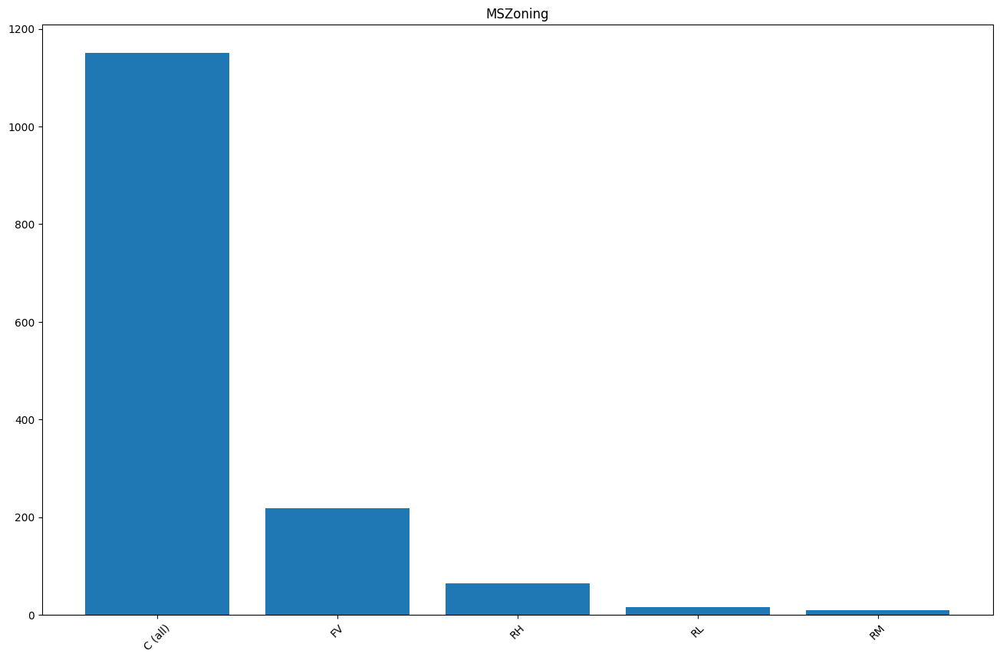

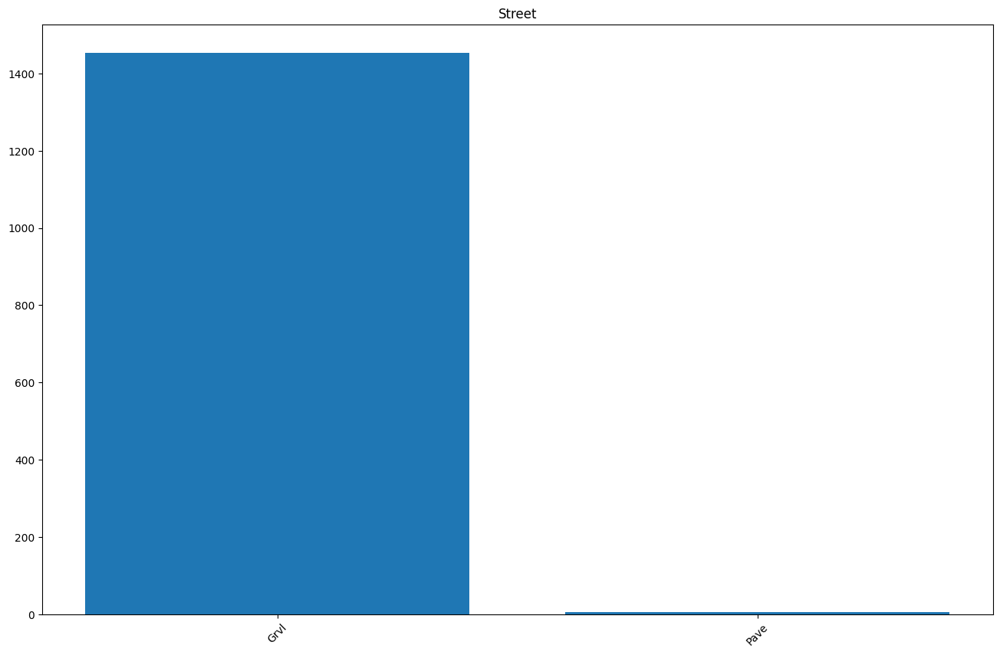

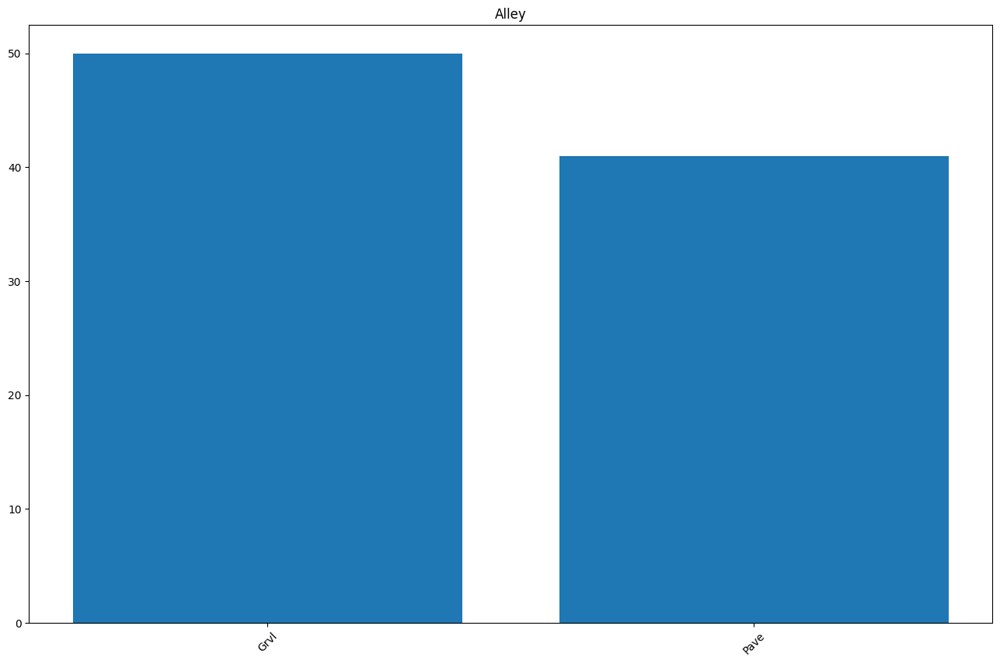

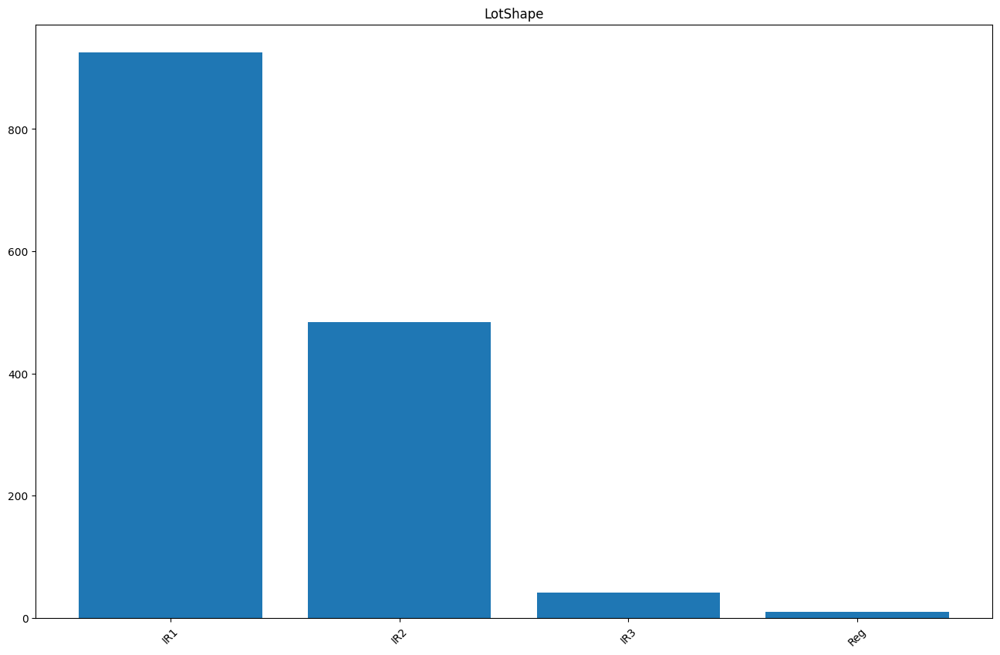

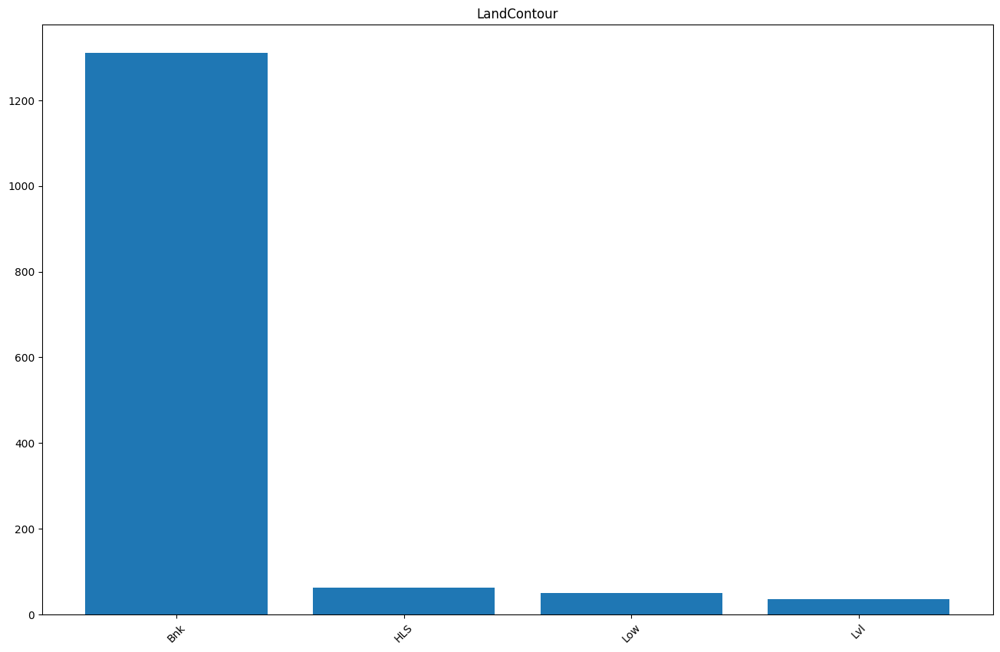

...

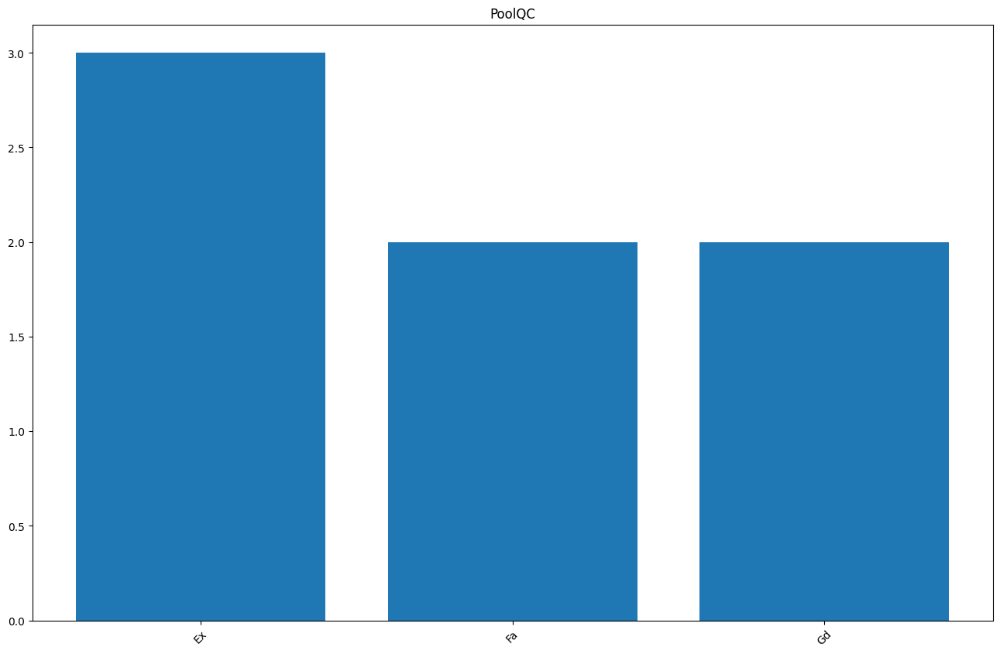

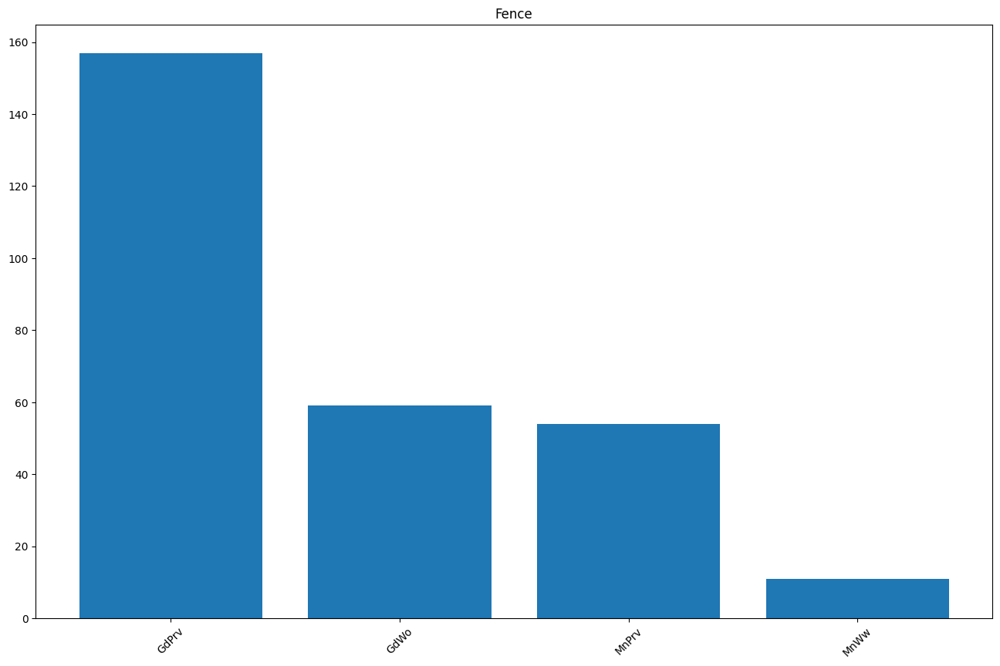

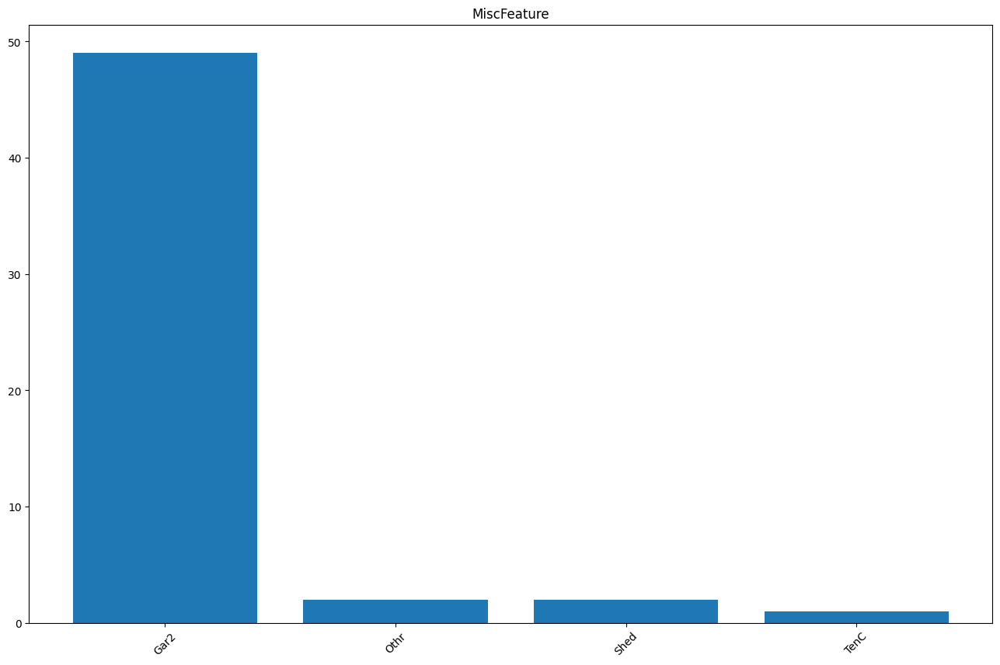

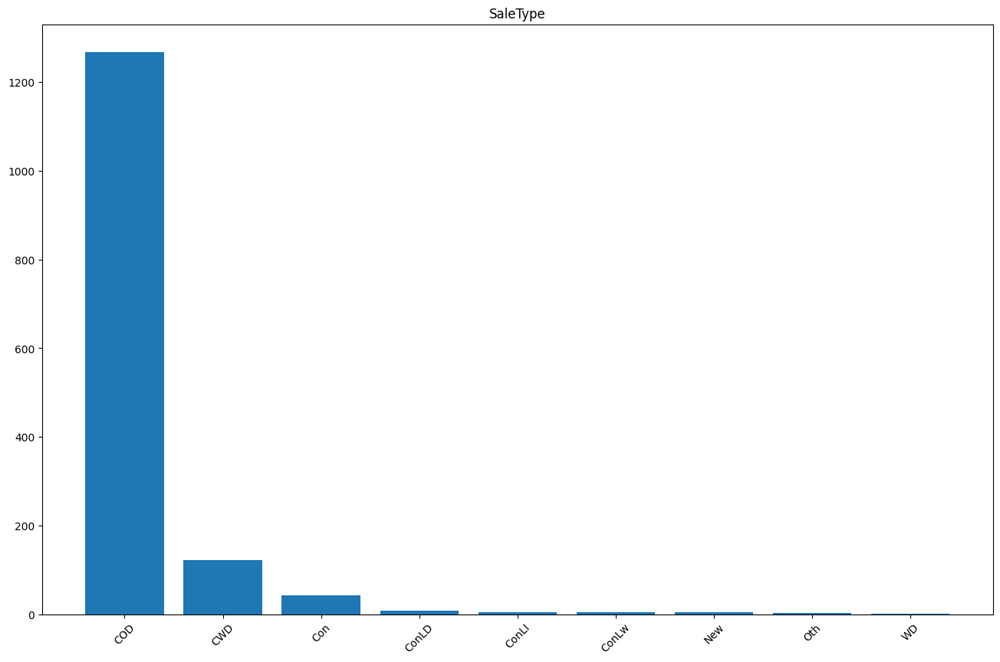

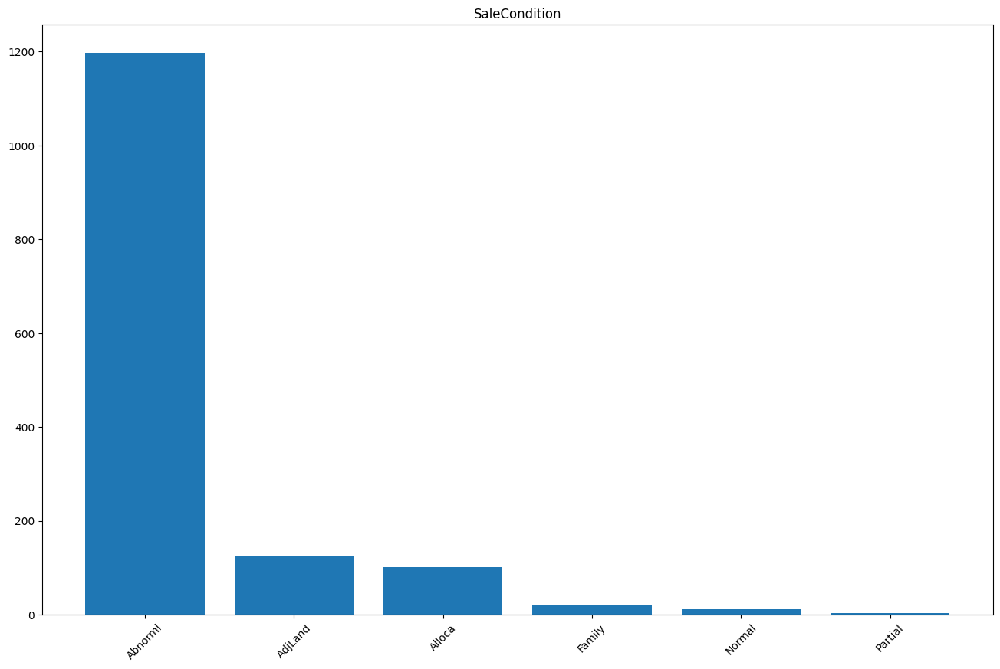

In [10]:
def hist_gen_graph(series):
    a = list(set(series.dropna().values))
    a.sort()
    b = series.value_counts(dropna=True)
    b = list(b)
    plt.figure(figsize=(16,10))
    plt.title(f"{series.name}")
    plt.xticks(rotation=45)
    plt.bar(a, b)
    plt.show()

for i in range(cat_df.shape[1]):
    try:
        hist_gen_graph(cat_df.iloc[:,i])
    except:
        continue

In [29]:
num_df = df.select_dtypes(include=[int,float])

In [30]:
corr = num_df.corr()
corr

,Id,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,...,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
Id,1.000000,0.011156,-0.010601,-0.033226,-0.028365,0.012609,-0.012713,-0.021998,-0.050298,-0.005024,...,-0.029643,-0.000477,0.002889,-0.046635,0.001330,0.057044,-0.006242,0.021172,0.000712,-0.021917
MSSubClass,0.011156,1.000000,-0.386347,-0.139781,0.032628,-0.059316,0.027850,0.040581,0.022936,-0.069836,...,-0.012579,-0.006100,-0.012037,-0.043825,-0.026030,0.008283,-0.007683,-0.013585,-0.021407,-0.084284
LotFrontage,-0.010601,-0.386347,1.000000,0.426095,0.251646,-0.059213,0.123349,0.088866,0.193458,0.233633,...,0.088521,0.151972,0.010700,0.070029,0.041383,0.206167,0.003368,0.011200,0.007450,0.351799
LotArea,-0.033226,-0.139781,0.426095,1.000000,0.105806,-0.005636,0.014228,0.013788,0.104160,0.214103,...,0.171698,0.084774,-0.018340,0.020423,0.043160,0.077672,0.038068,0.001205,-0.014261,0.263843
OverallQual,-0.028365,0.032628,0.251646,0.105806,1.000000,-0.091932,0.572323,0.550684,0.411876,0.239666,...,0.238923,0.308819,-0.113937,0.030371,0.064886,0.065166,-0.031406,0.070815,-0.027347,0.790982
OverallCond,0.012609,-0.059316,-0.059213,-0.005636,-0.091932,1.000000,-0.375983,0.073741,-0.128101,-0.046231,...,-0.003334,-0.032589,0.070356,0.025504,0.054811,-0.001985,0.068777,-0.003511,0.043950,-0.077856
YearBuilt,-0.012713,0.027850,0.123349,0.014228,0.572323,-0.375983,1.000000,0.592855,0.315707,0.249503,...,0.224880,0.188686,-0.387268,0.031355,-0.050364,0.004950,-0.034383,0.012398,-0.013618,0.522897
YearRemodAdd,-0.021998,0.040581,0.088866,0.013788,0.550684,0.073741,0.592855,1.000000,0.179618,0.128451,...,0.205726,0.226298,-0.193919,0.045286,-0.038740,0.005829,-0.010286,0.021490,0.035743,0.507101
MasVnrArea,-0.050298,0.022936,0.193458,0.104160,0.411876,-0.128101,0.315707,0.179618,1.000000,0.264736,...,0.159718,0.125703,-0.110204,0.018796,0.061466,0.011723,-0.029815,-0.005965,-0.008201,0.477493
BsmtFinSF1,-0.005024,-0.069836,0.233633,0.214103,0.239666,-0.046231,0.249503,0.128451,0.264736,1.000000,...,0.204306,0.111761,-0.102303,0.026451,0.062021,0.140491,0.003571,-0.015727,0.014359,0.386420


In [32]:
corr['SalePrice'].sort_values(ascending=False)

SalePrice        1.000000
OverallQual      0.790982
GrLivArea        0.708624
GarageCars       0.640409
GarageArea       0.623431
TotalBsmtSF      0.613581
1stFlrSF         0.605852
FullBath         0.560664
TotRmsAbvGrd     0.533723
YearBuilt        0.522897
YearRemodAdd     0.507101
GarageYrBlt      0.486362
MasVnrArea       0.477493
Fireplaces       0.466929
BsmtFinSF1       0.386420
LotFrontage      0.351799
WoodDeckSF       0.324413
2ndFlrSF         0.319334
OpenPorchSF      0.315856
HalfBath         0.284108
LotArea          0.263843
BsmtFullBath     0.227122
BsmtUnfSF        0.214479
BedroomAbvGr     0.168213
ScreenPorch      0.111447
PoolArea         0.092404
MoSold           0.046432
3SsnPorch        0.044584
BsmtFinSF2      -0.011378
BsmtHalfBath    -0.016844
MiscVal         -0.021190
Id              -0.021917
LowQualFinSF    -0.025606
YrSold          -0.028923
OverallCond     -0.077856
MSSubClass      -0.084284
EnclosedPorch   -0.128578
KitchenAbvGr    -0.135907
Name: SalePr

In [19]:
corr = corr['SalePrice'].sort_values(ascending=False)[:11]
corr

SalePrice       1.000000
OverallQual     0.790982
GrLivArea       0.708624
GarageCars      0.640409
GarageArea      0.623431
TotalBsmtSF     0.613581
1stFlrSF        0.605852
FullBath        0.560664
TotRmsAbvGrd    0.533723
YearBuilt       0.522897
YearRemodAdd    0.507101
Name: SalePrice, dtype: float64

In [20]:
a = list(dict(corr).keys())

In [28]:
num_df[a]

,SalePrice,OverallQual,GrLivArea,GarageCars,GarageArea,TotalBsmtSF,1stFlrSF,FullBath,TotRmsAbvGrd,YearBuilt,YearRemodAdd
0,208500,7,1710,2,548,856,856,2,8,2003,2003
1,181500,6,1262,2,460,1262,1262,2,6,1976,1976
2,223500,7,1786,2,608,920,920,2,6,2001,2002
3,140000,7,1717,3,642,756,961,1,7,1915,1970
4,250000,8,2198,3,836,1145,1145,2,9,2000,2000
...,...,...,...,...,...,...,...,...,...,...,...
1455,175000,6,1647,2,460,953,953,2,7,1999,2000
1456,210000,6,2073,2,500,1542,2073,2,7,1978,1988
1457,266500,7,2340,1,252,1152,1188,2,9,1941,2006
1458,142125,5,1078,1,240,1078,1078,1,5,1950,1996


In [16]:
pd.plotting.scatter_matrix(num_df[a], figsize=(100,100))
plt.show()

In [33]:
missing_data = df.isnull().sum() / len(df) * 100
missing_data = missing_data[missing_data > 0].sort_values(ascending=False)
missing_data

PoolQC          99.520548
MiscFeature     96.301370
Alley           93.767123
Fence           80.753425
MasVnrType      59.726027
FireplaceQu     47.260274
LotFrontage     17.739726
GarageType       5.547945
GarageYrBlt      5.547945
GarageFinish     5.547945
GarageQual       5.547945
GarageCond       5.547945
BsmtFinType2     2.602740
BsmtExposure     2.602740
BsmtFinType1     2.534247
BsmtCond         2.534247
BsmtQual         2.534247
MasVnrArea       0.547945
Electrical       0.068493
dtype: float64

In [38]:
data = []
for col in df.columns:
    data.append([col, df[col].dtype,
                 df[col].nunique(),
                 df[col].isnull().sum(),
                 df[col].isnull().sum() / len(df) * 100])
    
data = pd.DataFrame(data, columns=['Column', 'dtype', 'Nunique', 'Missing_Values', 'Percentage'])
data = data.sort_values(by='Percentage', ascending=False)
data = data[data.Percentage > 0]
data

,Column,dtype,Nunique,Missing_Values,Percentage
72,PoolQC,object,3,1453,99.520548
74,MiscFeature,object,4,1406,96.301370
6,Alley,object,2,1369,93.767123
73,Fence,object,4,1179,80.753425
25,MasVnrType,object,3,872,59.726027
57,FireplaceQu,object,5,690,47.260274
3,LotFrontage,float64,110,259,17.739726
59,GarageYrBlt,float64,97,81,5.547945
64,GarageCond,object,5,81,5.547945
58,GarageType,object,6,81,5.547945


In [51]:
# Let's impute the missing values in the dataset, object type with 'None', int type with 0, and the electrical column with the mode value. 
data = df.isna().sum().reset_index().rename(columns={0: 'Missing_Values', 'index': 'Column'})
column_missing = list(data[data['Missing_Values'] > 0]['Column'])
# imputing the missing values
for col in column_missing:
    if col == 'Electrical':
        df[col] = df[col].fillna(df[col].mode()[0])
    elif df[col].dtype == 'object':
        df[col] = df[col].fillna('None')
    else:
        df[col] = df[col].fillna(0)

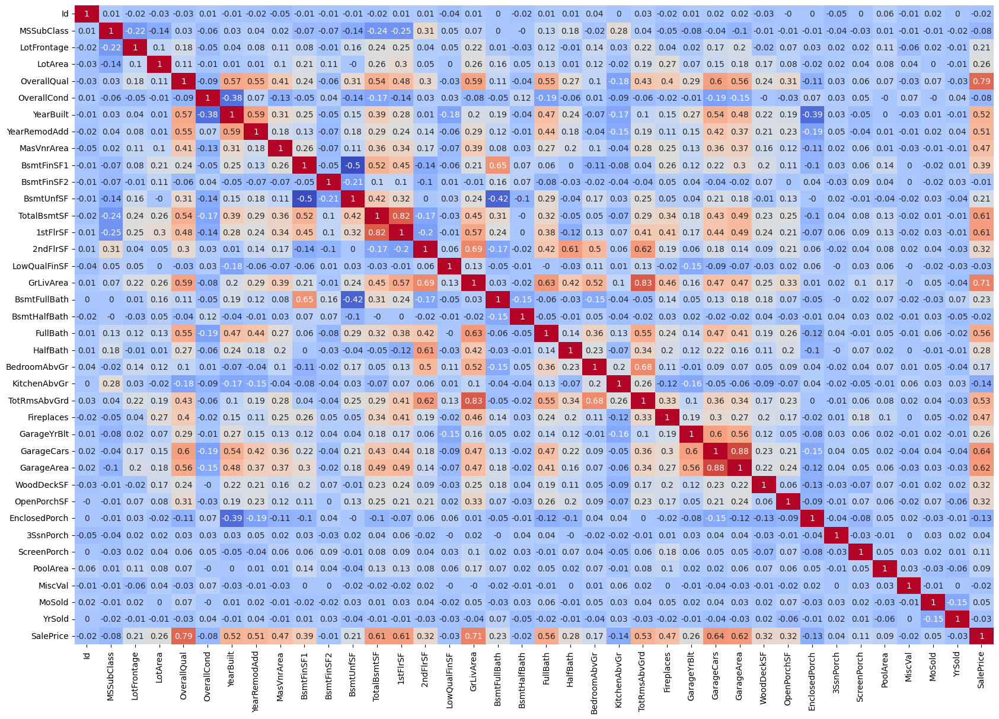

In [44]:
# checking the correlation of the dataset to see if multicollinearity exists
plt.figure(figsize=(20, 14))
# num_col = df_train[col].dtype == 'int64' or df_train[col].dtype == 'float64'
num_col = df.select_dtypes(include=['int64', 'float64'])
sns.heatmap(num_col.corr().round(2), annot=True, cmap='coolwarm', cbar=False)
plt.show()

Text(0.5, 0.98, 'Correlation between numerical features and Sales Price')

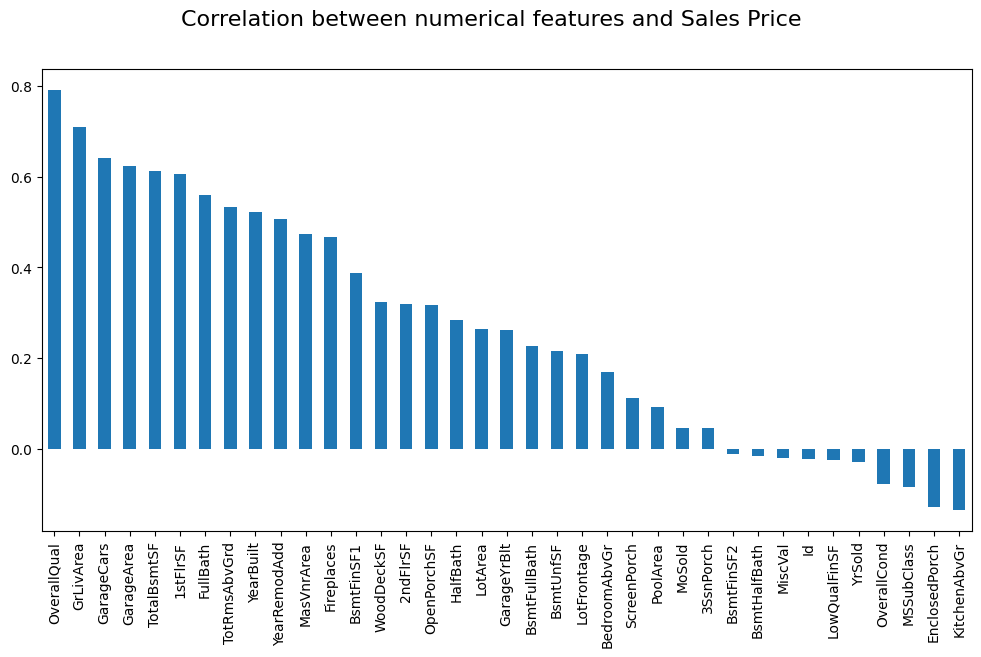

In [45]:
#Show Numerical features correlation with sales price
plt.figure(figsize=(12, 6))
df.select_dtypes(include=[np.number]).corr()['SalePrice'].sort_values(ascending = False).drop('SalePrice').plot(kind = 'bar')
plt.suptitle('Correlation between numerical features and Sales Price', fontsize=16)

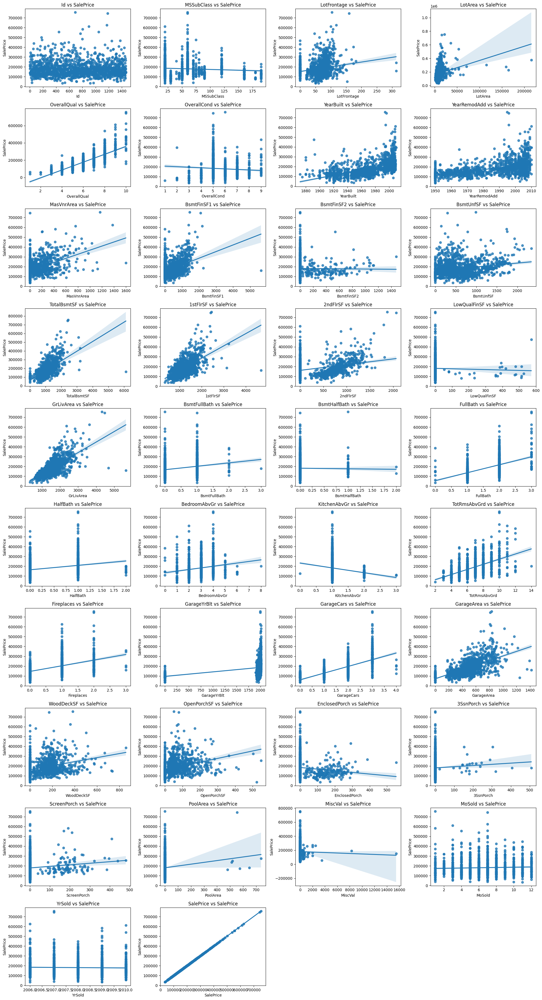

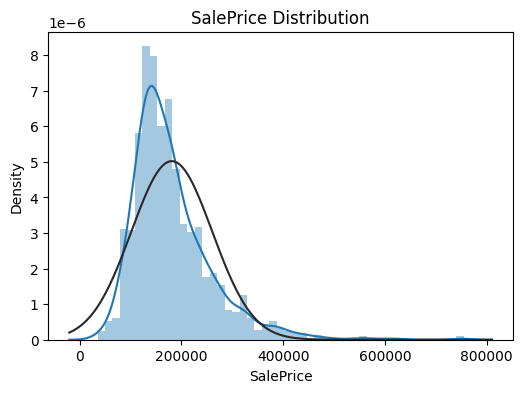

The skewness of the target variable is 1.8828757597682129
The kurtosis of the target variable is 6.536281860064529


In [49]:
# distribution of the num_cols with the target variable

plt.figure(figsize=(20, 40))
for i, col in enumerate(num_col.columns):
    plt.subplot(11, 4, i+1)
    sns.regplot(data=df, x=col, y='SalePrice')
    plt.title(f'{col} vs SalePrice')
plt.tight_layout()
plt.show()

# checking the distribution of the target variable
plt.figure(figsize=(6, 4))
sns.distplot(df['SalePrice'], fit=stats.norm)
plt.title('SalePrice Distribution')
plt.show()

# checking the skewness and kurtosis of the target variable
print(f"The skewness of the target variable is {df['SalePrice'].skew()}")
print(f"The kurtosis of the target variable is {df['SalePrice'].kurt()}")
# The target variable is right skewed and has a high kurtosis value.

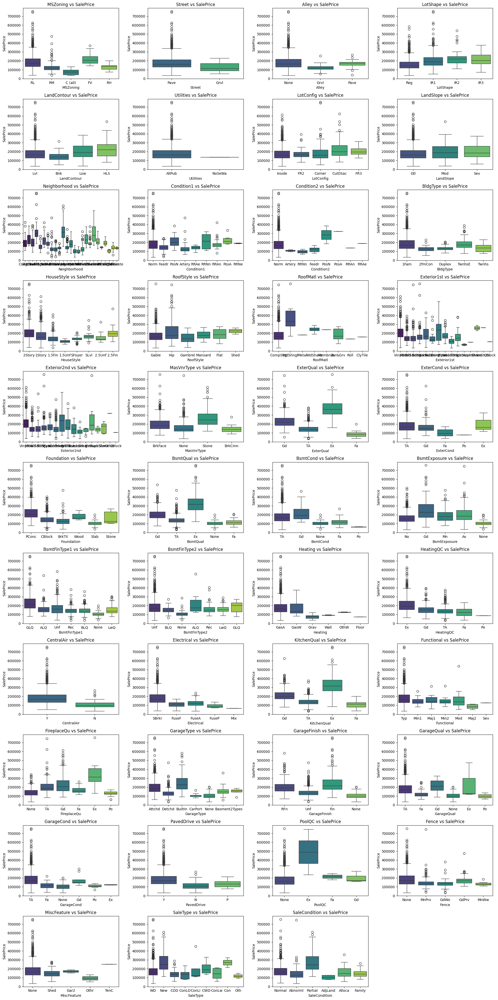

In [50]:
# Let's check the object columns distribution with the target variable through boxplot
cat_col = df.select_dtypes(include=['object'])
plt.figure(figsize=(20, 40))
for i, col in enumerate(cat_col.columns):
    plt.subplot(11, 4, i+1)
    sns.boxplot(data=df, x=col, y='SalePrice', palette='viridis')
    plt.title(f'{col} vs SalePrice')
plt.tight_layout()
plt.show()

***After checking the numerical columns and categorical columns distribution, we found that trends are different for each column. It is because of the reality in housing data that with the increase or decrease of the variables the price of the house changes. So, we will use different models to predict the house prices. We will use Linear Models, SVM and Bagging/Boosting models to predict the house prices. We will use the best model to predict the house prices.***

In [311]:
df = pd.read_csv('../dataset/train.csv')

In [312]:
def prep_df(df):
    # Let's impute the missing values in the dataset, object type with 'None', int type with 0, and the electrical column with the mode value. 
    data = df.isna().sum().reset_index().rename(columns={0: 'Missing_Values', 'index': 'Column'})
    column_missing = list(data[data['Missing_Values'] > 0]['Column'])
    # imputing the missing values
    for col in column_missing:
        if col == 'Electrical':
            df[col] = df[col].fillna(df[col].mode()[0])
        elif df[col].dtype == 'object':
            df[col] = df[col].fillna('None')
        else:
            df[col] = df[col].fillna(0)
    object_cols = df.select_dtypes(include=['object']).columns
    encoder = OrdinalEncoder()
    for column in object_cols:
        df[column] = encoder.fit_transform(df[column].values.reshape(-1, 1))
    return df
        

In [313]:
df = prep_df(df)
df

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,3.0,65.0,8450,1.0,1.0,3.0,3.0,0.0,...,0,3.0,4.0,1.0,0,2,2008,8.0,4.0,208500
1,2,20,3.0,80.0,9600,1.0,1.0,3.0,3.0,0.0,...,0,3.0,4.0,1.0,0,5,2007,8.0,4.0,181500
2,3,60,3.0,68.0,11250,1.0,1.0,0.0,3.0,0.0,...,0,3.0,4.0,1.0,0,9,2008,8.0,4.0,223500
3,4,70,3.0,60.0,9550,1.0,1.0,0.0,3.0,0.0,...,0,3.0,4.0,1.0,0,2,2006,8.0,0.0,140000
4,5,60,3.0,84.0,14260,1.0,1.0,0.0,3.0,0.0,...,0,3.0,4.0,1.0,0,12,2008,8.0,4.0,250000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,1456,60,3.0,62.0,7917,1.0,1.0,3.0,3.0,0.0,...,0,3.0,4.0,1.0,0,8,2007,8.0,4.0,175000
1456,1457,20,3.0,85.0,13175,1.0,1.0,3.0,3.0,0.0,...,0,3.0,2.0,1.0,0,2,2010,8.0,4.0,210000
1457,1458,70,3.0,66.0,9042,1.0,1.0,3.0,3.0,0.0,...,0,3.0,0.0,3.0,2500,5,2010,8.0,4.0,266500
1458,1459,20,3.0,68.0,9717,1.0,1.0,3.0,3.0,0.0,...,0,3.0,4.0,1.0,0,4,2010,8.0,4.0,142125


In [314]:
X = df.drop('SalePrice', axis=1)
y = df['SalePrice']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# checking the shape of the dataset after splitting
print(f"X_train shape: ", X_train.shape)
print(f"X_test shape: ", X_test.shape)
print(f"y_train shape: ", y_train.shape)
print(f"y_test shape: ", y_test.shape)

X_train shape:  (1168, 80)
X_test shape:  (292, 80)
y_train shape:  (1168,)
y_test shape:  (292,)


In [315]:
# using the standard scaler to scale the dataset
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

In [316]:
lin_reg = LinearRegression()
lin_reg.fit(X_train, y_train)
prediction = lin_reg.predict(X_test)
lin_reg_rmse = np.sqrt(mean_squared_error(y_test, prediction))
lin_reg_rmse

34224.03521085038

***Linear regression performance in not good enough***

In [317]:
svr = SVR()
svr.fit(X_train, y_train)
prediction = svr.predict(X_test)
svr_rmse = np.sqrt(mean_squared_error(y_test, prediction))
svr_rmse

88639.50704663064

In [318]:
cart = DecisionTreeRegressor(random_state=42)
cart.fit(X_train, y_train)
prediction = cart.predict(X_test)
cart_rmse = np.sqrt(mean_squared_error(y_test, prediction))
cart_rmse

39881.77841256976

In [319]:
ada = AdaBoostRegressor(random_state=42)
ada.fit(X_train, y_train)
prediction = ada.predict(X_test)
ada_rmse = np.sqrt(mean_squared_error(y_test, prediction))
ada_rmse

35310.514729952854

In [320]:
gbr = GradientBoostingRegressor(random_state=42)
gbr.fit(X_train, y_train)
prediction = gbr.predict(X_test)
gbr_rmse = np.sqrt(mean_squared_error(y_test, prediction))
gbr_rmse

28329.0263905141

In [321]:
ebr = ExtraTreeRegressor(random_state=42)
ebr.fit(X_train, y_train)
prediction = ebr.predict(X_test)
ebr_rmse = np.sqrt(mean_squared_error(y_test, prediction))
ebr_rmse

55009.63330047511

In [322]:
rf = RandomForestRegressor(random_state=42)
rf.fit(X_train, y_train)
prediction = rf.predict(X_test)
rf_rmse = np.sqrt(mean_squared_error(y_test, prediction))
rf_rmse

28693.766444365076

In [323]:
xgb = XGBRegressor()
xgb.fit(X_train, y_train)
prediction = xgb.predict(X_test)
xgb_rmse = np.sqrt(mean_squared_error(y_test, prediction))
xgb_rmse

27075.604537667597

***Grid Search for Random Forest and xGBoost***

In [324]:
model = RandomForestRegressor()
rf_params = {'n_estimators': [20, 40, 60, 80],
             'max_features': [0.2, 0.6, 1.0],
             'max_depth': [2,4, None],
             'min_samples_leaf': [1, 2, 4],
             'random_state': [42]}
grid_rf = GridSearchCV(estimator = model,
                       param_grid = rf_params, 
                       cv=5,
                       verbose = 2,
                       n_jobs = -1)

grid_rf.fit(X_train, y_train)

Fitting 5 folds for each of 108 candidates, totalling 540 fits


GridSearchCV(cv=5, estimator=RandomForestRegressor(), n_jobs=-1,
             param_grid={'max_depth': [2, 4, None],
                         'max_features': [0.2, 0.6, 1.0],
                         'min_samples_leaf': [1, 2, 4],
                         'n_estimators': [20, 40, 60, 80],
                         'random_state': [42]},
             verbose=2)

In [340]:
grid_rf.best_params_

{'max_depth': None,
 'max_features': 0.6,
 'min_samples_leaf': 1,
 'n_estimators': 80,
 'random_state': 42}

In [341]:
rf = RandomForestRegressor(max_depth = None, 
                           max_features = 0.6, min_samples_leaf = 1, 
                           n_estimators = 80, random_state = 42)
rf.fit(X_train, y_train)
prediction = rf.predict(X_test)
rf_rmse = np.sqrt(mean_squared_error(y_test, prediction))
rf_rmse

28543.48674426345

In [327]:
xgb = XGBRegressor()

param_xgb = {'n_estimators': [20, 40, 60, 80, 100],
             'max_depth': [2, 4, 6],
             'learning_rate': [0.01, 0.1, 0.2],
             'gamma': [0.1, 0.2],
             'reg_alpha': [0.01, 0.1, 0.2],
             'subsample': [0.5, 0.6]}

grid_xgb = GridSearchCV(estimator=xgb,
                        param_grid=param_xgb,
                        cv=5,
                        verbose=2,
                        n_jobs=-1)

grid_xgb.fit(X_train, y_train)

Fitting 5 folds for each of 540 candidates, totalling 2700 fits


GridSearchCV(cv=5,
             estimator=XGBRegressor(base_score=None, booster=None,
                                    callbacks=None, colsample_bylevel=None,
                                    colsample_bynode=None,
                                    colsample_bytree=None, device=None,
                                    early_stopping_rounds=None,
                                    enable_categorical=False, eval_metric=None,
                                    feature_types=None, gamma=None,
                                    grow_policy=None, importance_type=None,
                                    interaction_constraints=None,
                                    learning_rate=None, m...
                                    max_depth=None, max_leaves=None,
                                    min_child_weight=None, missing=nan,
                                    monotone_constraints=None,
                                    multi_strategy=None, n_estimators=None,
                                    n_jobs=None, num_parallel_tree=None,
                                    random_state=None, ...),
             n_jobs=-1,
             param_grid={'gamma': [0.1, 0.2], 'learning_rate': [0.01, 0.1, 0.2],
                         'max_depth': [2, 4, 6],
                         'n_estimators': [20, 40, 60, 80, 100],
                         'reg_alpha': [0.01, 0.1, 0.2],
                         'subsample': [0.5, 0.6]},
             verbose=2)

In [342]:
grid_xgb.best_params_

{'gamma': 0.1,
 'learning_rate': 0.1,
 'max_depth': 4,
 'n_estimators': 100,
 'reg_alpha': 0.01,
 'subsample': 0.6}

In [343]:
xgb = XGBRegressor(gamma = 0.1, learning_rate = 0.1, max_depth = 4, n_estimators = 100, reg_alpha = 0.01, subsample = 0.6)
xgb.fit(X_train, y_train)
prediction = xgb.predict(X_test)
xgb_rmse = np.sqrt(mean_squared_error(y_test, prediction))
xgb_rmse

25038.730907429093

In [344]:
min(gbr_rmse, rf_rmse, xgb_rmse)

25038.730907429093

In [358]:
df_test = pd.read_csv('../dataset/test.csv')
df_test.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition
0,1461,20,RH,80.0,11622,Pave,NaN,Reg,Lvl,AllPub,...,120,0,NaN,MnPrv,NaN,0,6,2010,WD,Normal
1,1462,20,RL,81.0,14267,Pave,NaN,IR1,Lvl,AllPub,...,0,0,NaN,NaN,Gar2,12500,6,2010,WD,Normal
2,1463,60,RL,74.0,13830,Pave,NaN,IR1,Lvl,AllPub,...,0,0,NaN,MnPrv,NaN,0,3,2010,WD,Normal
3,1464,60,RL,78.0,9978,Pave,NaN,IR1,Lvl,AllPub,...,0,0,NaN,NaN,NaN,0,6,2010,WD,Normal
4,1465,120,RL,43.0,5005,Pave,NaN,IR1,HLS,AllPub,...,144,0,NaN,NaN,NaN,0,1,2010,WD,Normal


In [359]:
# Lets impute missing values from the test dataset

from sklearn.impute import KNNImputer
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer, SimpleImputer


imputer_object = SimpleImputer(strategy='most_frequent') 
imputer_num = IterativeImputer(estimator=RandomForestRegressor())

In [360]:
df_test = prep_df(df_test)
df_test.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition
0,1461,20,3.0,80.0,11622,1.0,1.0,3.0,3.0,0.0,...,120,0,2.0,2.0,1.0,0,6,2010,9.0,4.0
1,1462,20,4.0,81.0,14267,1.0,1.0,0.0,3.0,0.0,...,0,0,2.0,4.0,0.0,12500,6,2010,9.0,4.0
2,1463,60,4.0,74.0,13830,1.0,1.0,0.0,3.0,0.0,...,0,0,2.0,2.0,1.0,0,3,2010,9.0,4.0
3,1464,60,4.0,78.0,9978,1.0,1.0,0.0,3.0,0.0,...,0,0,2.0,4.0,1.0,0,6,2010,9.0,4.0
4,1465,120,4.0,43.0,5005,1.0,1.0,0.0,1.0,0.0,...,144,0,2.0,4.0,1.0,0,1,2010,9.0,4.0


In [361]:
# predicting the test dataset
df_test = scaler.transform(df_test)
prediction = xgb.predict(df_test)
prediction

array([134377.02 , 163940.4  , 180081.22 , ..., 155764.75 , 122621.555,
       216502.97 ], dtype=float32)

In [371]:
submission = pd.read_csv('../dataset/sample_submission.csv')
submission

,Id,SalePrice
0,1461,169277.052498
1,1462,187758.393989
2,1463,183583.683570
3,1464,179317.477511
4,1465,150730.079977
...,...,...
1454,2915,167081.220949
1455,2916,164788.778231
1456,2917,219222.423400
1457,2918,184924.279659


In [372]:
submission['SalePrice'] = prediction

In [377]:
submission.to_csv('../dataset/sample_submission.csv', index=False)